# Assignment 4 - Stitching
Jakob Alsaker - 2023951069

Computer Vision - Professor Wallraven

21-05-2023

I sadly could not implement the whole pipeline as my refined matches never worked well. I have tried several methods though never succeded. I therefore have not included a expriment of testing the parameters. The match2Images seems to be working fine with the use of normalized cross correlation though the euclidean distance seems to be quite ineffective. Furthermore the warp function has not been tested fully as the refinedmatches did not get good matches though the function seems to work. There is implemented the openCV method to get a full panorama picture to see how my code could have done it

In [14]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import time
import numpy as np
from matplotlib.patches import ConnectionPatch
import cv2 # yes, you can do this, but see below!

In [15]:
def rgb2gray(rgb): ### Inspired from: https://stackoverflow.com/questions/12201577/how-can-i-convert-an-rgb-image-into-grayscale-in-python ###
    r, g, b = rgb[:,:,0], rgb[:,:,1], rgb[:,:,2]
    gray = 0.2989 * r + 0.5870 * g + 0.1140 * b
    return gray

In [16]:
def loadImages(Rotate = 0,gray = True):
    images = []
    for i in range(1,19):
        image = plt.imread('Pictures_new/{0}.jpg'.format(i))
        if Rotate > 0:
            image = np.rot90(image,Rotate)
        image = image.astype(float)
        if gray:
            image = rgb2gray(image)
        images.append(image)
    images = np.float32(images)
    return images

In [17]:
def filter(weights,roi): # this function will filter an roi using a set of weights
    # these two lines are important as they ensure correct
    # computations!
    weights = weights.astype(np.float32)    # convert correctly
    roi = roi.astype(np.float32)            # convert correctly
    # this holds the end result
    filtered = np.zeros_like(roi)
    width = int((weights.shape[1]-1)/2)
    height = int((weights.shape[0]-1)/2)
    # Doing the filtering
    for i in range(height,roi.shape[1]-height):
        for j in range(width,roi.shape[0]-width):
            filtered[j,i]=np.sum(np.multiply(weights,roi[j-width:j+width+1,i-height:i+height+1]))
    return(filtered)

In [18]:
def from_homogenous(points):
    # getting the current shape of the inputtet matrix
    col = np.shape(points)
    # Checking if the current matrix is homogenous or non-homogenous
    if col == 3:
        # getting the last column
        q = points[:,-1]
        # Inserting the last column into the others
        points[:,0] = np.divide(points[:,0],q)
        points[:,1] = np.divide(points[:,1],q)
        # Removing the last column
        points = np.delete(points,-1,1)
    elif col == 4:
        # As the 4th column is zero, it can just be deleted
        points = np.delete(points,-1,1)
    return points

In [19]:
def cornerDetect(img,winSize=7,type=0):
    if winSize < 5:
        tol_h = 0.04
        tol_e = 0.04
    else:
        tol_h = 10000 # Tolerance for the Harris method
        #tol_e = 40000 # Tolerance for the Eigvalue method
        #tol_h = 0.3
        tol_e = 0.3
    points = np.array([[0,0,0]]) # Making array to save future edge coordinates
    
    # getting the size of the image
    h_img = int(img.shape[0]) # height
    w_img = int(img.shape[1]) # Width
    b = int((winSize-1)/2) # 1/2 of window size

    # Using the sobel filter for the derivative
    w_x = np.array([[-1,0,1],[-2,0,2],[-1,0,1]])*1/8
    w_y = np.array([[1,2,1],[0,0,0],[-1,-2,-1]])*1/8

    I_x = filter(w_x,img)
    I_y = filter(w_y,img)
    
    # Iterating through each pixel in the picture to find egdes
 #   for i in range(b,h_img-b):
 #       for j in range(b,w_img-b):
    for i in range(b,h_img-b):
        for j in range(b,w_img-b):

            # Getting the derivative for the image in x- and y-coordinate
            tmp_Ix = I_x[i-b:i+b+1,j-b:j+b+1]
            tmp_Iy = I_y[i-b:i+b+1,j-b:j+b+1]

            # Getting the Second Moment matrix of the image
            H = np.array([
                [np.sum(np.dot(tmp_Ix,np.transpose(tmp_Ix))), np.sum(np.dot(tmp_Ix,np.transpose(tmp_Iy)))],
                [np.sum(np.dot(tmp_Ix,np.transpose(tmp_Iy))), np.sum(np.dot(tmp_Iy,np.transpose(tmp_Iy)))]])
            
            # Choosing the Harris method!
            if type == 1:
                h = np.divide(np.linalg.det(H),np.trace(H))
                if h >= tol_h:
                    points = np.append(points,[[j,i,h]],axis=0)
            # Else choosing the Eigenvalue method!
            else:
                # Getting the Eigenvalues of the matrix
                eigval,meh = np.linalg.eig(H)
                eigval = np.array(eigval)
                
                # Checking if the eigenvalues are above the tolerance
                if all(eigval >= tol_e):
                    points = np.append(points,[[j,i,eigval]],axis=0)
    points = np.delete(points,0,axis=0) # Removing the first point
    # Make Non-Maximum Suppression
    point = []
    size = 25

    # take only unique points
    points = np.unique(points,axis=0)
    # Look around each point and append the point with the highest h-value
    for i in range(points.shape[0]):
        tmp = points[(points[:,0] >= points[i,0]-size) & (points[:,0] <= points[i,0]+size)]
        if tmp.shape[0] > 1:
            tmp = np.unique(tmp,axis=0)
            tmp = tmp[(tmp[:,1] >= points[i,1]-size) & (tmp[:,1] <= points[i,1]+size)]
            if tmp.shape[0] > 1:
                index = np.argmax(tmp[:,2])
                point.append([tmp[index,0],tmp[index,1]])
    # Look around each point and append the point with the highest h-value
    # Take only unique points
    point = np.unique(point,axis=0)
    p = [] # Making list
    for i in range(len(point)): # Iterating through the points
        tmp = points[(points[:,1] >= point[i][1]-size) & (points[:,1] <= point[i][1]+size)] # See if points are in the windows
        if tmp.shape[0] > 1: # See if there is more than 1 point
            tmp = np.unique(tmp,axis=0) # Checking of uniqueness
            tmp = tmp[(tmp[:,0] >= point[i][0]-size) & (tmp[:,0] <= point[i][0]+size)]
            if tmp.shape[0] > 1:
                index = np.argmax(tmp[:,2]) # Taking the highest h-value point
                p.append([tmp[index,0],tmp[index,1]]) # Appending the point
    # Take only unique points
    p = np.unique(p,axis=0)

    # Plotting the points
    plt.figure()
    plt.imshow(img,cmap='gray')
    plt.plot(p[:,0],p[:,1],'r.')
    plt.show()
    return p

In [20]:
def getFeatureDescriptors(img,points,winSize=3):
    # Getting the size of the image
    h_img = int(img.shape[0]) # height
    w_img = int(img.shape[1]) # Width
    b = int((winSize-1)/2) # 1/2 of window size

    feature = []
    for i in range(len(points)):
        tmp = img[int(points[i][1])-b:int(points[i][1])+b+1,int(points[i][0])-b:int(points[i][0])+b+1]
        feature.append(tmp)
    return feature

In [21]:
def match2Images(img1,img2,p1, p2, img1_fds, img2_fds, ratioThreshold=0.7,plotting=True,state = 0):
    # Find match between two images using the eculedian distance and the ratio test
    def ecldist(fd1,fd2):
        return(np.linalg.norm(fd1-fd2))
    
    # Find match between two images using the normalized cross correlation
    def norm_cross_correlation(fd1,fd2): # Insert the feature descriptor for image 1 and 2
        product = np.mean((fd1 - fd1.mean()) * (fd2 - fd2.mean()))
        stds = fd1.std() * fd2.std()
        if stds == 0:
            return 0
        else:
            product /= stds
        return product

    matches = [] # Save the matches
    for i in range(len(img1_fds)): # Iterate the feature descriptors
        for j in range(len(img2_fds)):
            try: # Try to get the matches. If the 
                if state == 0:
                    dist = ecldist(img1_fds[i],img2_fds[j]) # Get the euclidean distance
                    if dist < 1-ratioThreshold: # See if the distance is below the threshold
                        matches.append([p1[i],p2[j]]) # Save the points
                else:
                    dist = norm_cross_correlation(img1_fds[i],img2_fds[j])
                    if dist > ratioThreshold:
                        matches.append([p1[i],p2[j]]) # Save the points
            except:
                continue
    
    # Plotting the matches
    print("Plotting")
    if plotting:
        img = np.concatenate((img1,img2),axis=1) # Combining the two images
        plt.imshow(img,cmap='gray') # Plotting the image
        for i in range(len(matches)):   # Iterating the images
            plt.plot([matches[i][0][0],matches[i][1][0]+img1.shape[1]],[matches[i][0][1],matches[i][1][1]],'r') # Plotting the matches for the images
        plt.show()
    return matches

In [22]:
def refineMatches(matches, img1, img2, inlier_threshold=500,iter=1000):
    best_fit = 0
    best_inlier = []
    best_error = np.inf
    ite = 0
    maybe_inliers = []
    # Fitting
    while ite < iter:
        # Getting 4 random points
        rand_n = np.random.randint(0,len(matches),4)
        for x in range(len(rand_n)):
            maybe_inliers.append(matches[rand_n[x]])
        # Getting the homography
        A = np.zeros([2*len(maybe_inliers),9])
        for i in range(len(maybe_inliers)):
            A[2*i,:] = [maybe_inliers[i][0][0],maybe_inliers[i][0][1],1,0,0,0,-maybe_inliers[i][1][0]*maybe_inliers[i][0][0],-maybe_inliers[i][1][0]*maybe_inliers[i][0][1],-maybe_inliers[i][1][0]]
            A[2*i+1,:] = [0,0,0,maybe_inliers[i][0][0],maybe_inliers[i][0][1],1,-maybe_inliers[i][1][1]*maybe_inliers[i][0][0],-maybe_inliers[i][1][1]*maybe_inliers[i][0][1],-maybe_inliers[i][1][1]]
        
        # Find the eigenvalues and eigenvectors
        eig,eigv = np.linalg.eig(A.T@A)
        # Store eigenvector with smallest eigenvalue
        H = eigv[:,np.argmin(eig)]
        # Reshaping the homography
        H = H.reshape(3,3)
        # Normalizing the homography
        H = H/H[2,2]
        H = from_homogenous(H)
        # Finding the inliers
        inliers = []
        for i in range(len(matches)):
            ### Calculating the error ###
            # Making the points into arrays so it can be transposed
            p1 = np.array([matches[i][0][0],matches[i][0][1]])
            p2 = np.array([matches[i][1][0],matches[i][1][1]])

            # Adding the homogenous coordinate
            p1 = np.append(p1,1)
            p2 = np.append(p2,1)
            error = np.linalg.norm(p2-H*np.transpose(p1))

            # See if linlier is within the threshhold
            if error < inlier_threshold:
                inliers.append(matches[i]) # Saving the inliers for this match
        # Checking if the number of inliers is greater than the best fit
        if len(inliers) > best_fit:
            best_fit = len(inliers) # Getting the amount of inliers
            best_inlier = inliers  # Storing the inliers
            H_best = H              # Having the homography
            best_error = error      # Saving the error
        ite += 1
    # plot the inliers with the img1 being on the right and img2 on the left
    img = np.concatenate((img1,img2),axis=1) # Combining the two images
    plt.imshow(img,cmap='gray') # Plotting the image
    for i in range(len(best_inlier)):   # Iterating the images
        con = ConnectionPatch(xyA=(best_inlier[i][0][0],best_inlier[i][0][1]),xyB=(best_inlier[i][1][0]+img1.shape[1],best_inlier[i][1][1]),coordsA="data",coordsB="data",axesA=plt.gca(),axesB=plt.gca(),color="red")
        plt.gca().add_artist(con) # Adding the line to the plot
    plt.show()
    if len(best_inlier) > 0:
        print("Number of inliers: ", len(best_inlier))
        print("Average residual: ", best_error/len(best_inlier))
    else:
        raise Exception("No matches between images")
    return H_best
    

In [23]:
def refineMatches2(matches,img1,img2,inlier_threshold=50,iter=100):
    best_inlier = []
    maybe_inliers = []
    for i in range(iter):
        # Getting 4 random matches
        rand_n = np.random.randint(0,len(matches),4)
        for x in range(len(rand_n)):
            maybe_inliers.append(matches[rand_n[x]])
        
        # Getting the homography
        A = np.zeros([2*len(maybe_inliers),9])
        for i in range(len(maybe_inliers)):
            A[2*i,:] = [maybe_inliers[i][0][0],maybe_inliers[i][0][1],1,0,0,0,-maybe_inliers[i][1][0]*maybe_inliers[i][0][0],-maybe_inliers[i][1][0]*maybe_inliers[i][0][1],-maybe_inliers[i][1][0]]
            A[2*i+1,:] = [0,0,0,maybe_inliers[i][0][0],maybe_inliers[i][0][1],1,-maybe_inliers[i][1][1]*maybe_inliers[i][0][0],-maybe_inliers[i][1][1]*maybe_inliers[i][0][1],-maybe_inliers[i][1][1]]
        _,_,e = np.linalg.svd(A)
        H = e[-1].reshape(3,3)

        # Get the inliers
        inliers = []
        for i in range(len(matches)):
            # Making the points into arrays so it can be transposed
            p1 = np.array([matches[i][0][0],matches[i][0][1]])
            p2 = np.array([matches[i][1][0],matches[i][1][1]])
            # Adding the homogenous coordinate for point 1
            p1 = np.append(p1,1)
            p1_d = np.dot(H,p1) # Getting the transformed point
            p1_d = from_homogenous(p1_d) # Getting the point back to non-homogenous
            # Get the error by taking the distance between match 1 and match 2
            dist = np.sqrt((p1_d[0]-p2[0])**2+(p1_d[1]-p2[1])**2)
            # See if linlier is within the threshhold
            if dist < inlier_threshold:
                inliers.append(matches[i])
        # Checking if the number of inliers is greater than the best fit
        if len(inliers) > len(best_inlier):
            best_inlier = inliers
            H_best = H
    # plot the inliers with the img1 being on the left and img2 on the right
    img = np.concatenate((img1,img2),axis=1) # Combining the two images
    plt.imshow(img,cmap='gray') # Plotting the image
    print(best_inlier)
    for i in range(len(best_inlier)): # Iterating the images
        # Plot lines between the matches with the use of connectionpatch
        con = ConnectionPatch(xyA=(best_inlier[i][0][0],best_inlier[i][0][1]),xyB=(best_inlier[i][1][0]+img1.shape[1],best_inlier[i][1][1]),coordsA="data",coordsB="data",axesA=plt.gca(),axesB=plt.gca(),color="red")
        plt.gca().add_artist(con) # Adding the line to the plot 
        
    plt.show()
    if len(best_inlier) > 0:
        print("Number of inliers: ", len(best_inlier))
    else:
        raise Exception("No matches between images")
    return H_best





In [24]:
def wrapImages(imgs, H):
    h_old = H[0] # Getting the homography for the first image
    for x in range(len(imgs)-1): # Iterating through the images
        h_new = np.dot(h_old,H[x]) # Taking the dot product between the two homographies
        warp_img = cv2.warpPerspective(imgs[x+1], h_new, (imgs[x].shape[1]+abs(int(h_new[0,2])), imgs[x].shape[0])) # Using the warp function from OpenCV to get the new perspective
        warp_img[:,0:imgs[x].shape[1]] = imgs[x] # Adding the image to the warped image
        h_old = h_new # Saving the homography
    # plot panorama
    plt.imshow(warp_img,cmap='gray')
    plt.show()
    return warp_img

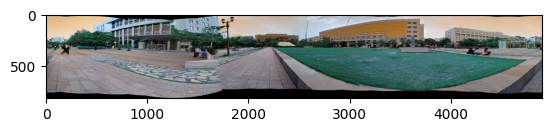

In [25]:
# OpenCV - Stitching
imgs = [] # Storing images
# Receiving images
for i in range(1,18):
    name = 'Pictures_new/'+str(i)+'.jpg' # Getting pictures
    tmp = cv2.imread(name) # Reading the images
    tmp = cv2.resize(tmp,(1000, 800), interpolation=cv2.INTER_AREA) # Rezing the images
    imgs.append(tmp)
# Create object for stitching
stitcher = cv2.Stitcher_create(cv2.Stitcher_PANORAMA)
# Full OpenCV pipeline for stitching
status, dst = stitcher.stitch(imgs)

# Plotting the Stitching
plt.imshow(dst)
plt.show()

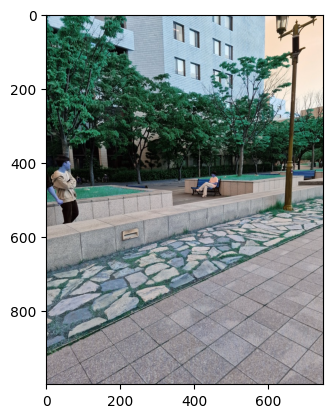

In [26]:
# Give an example of plt.imshow() with a color image
img = cv2.imread('Pictures_new/1.jpg')
plt.imshow(img)
plt.show()


C:\Users\Inovicht\AppData\Local\Temp\ipykernel_20112\1807611973.py:41: RuntimeWarning: invalid value encountered in divide
  h = np.divide(np.linalg.det(H),np.trace(H))


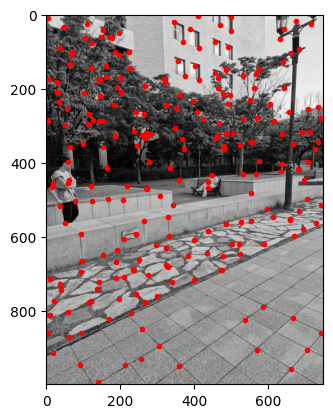

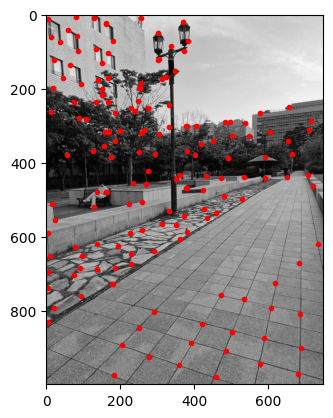

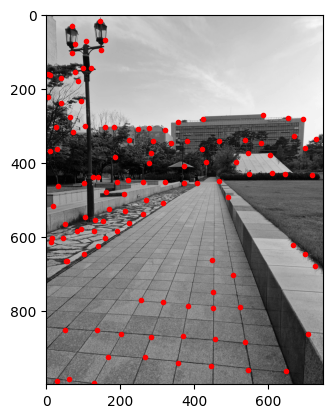

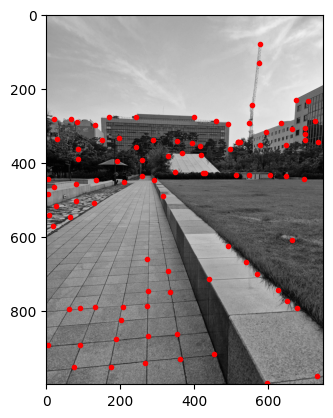

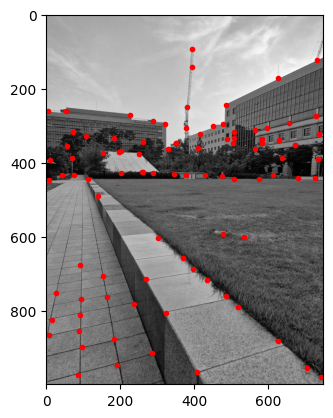

...

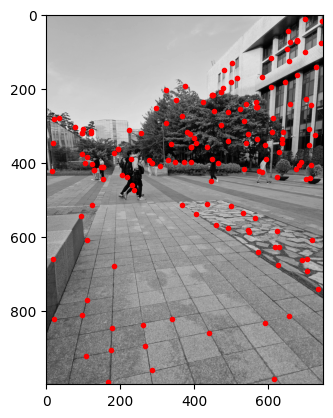

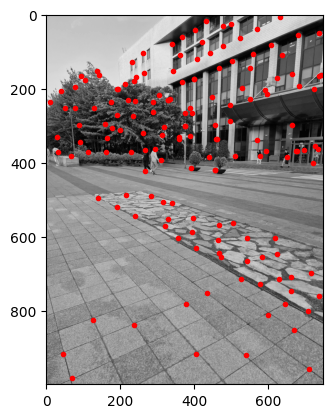

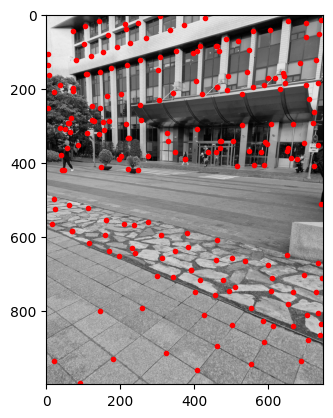

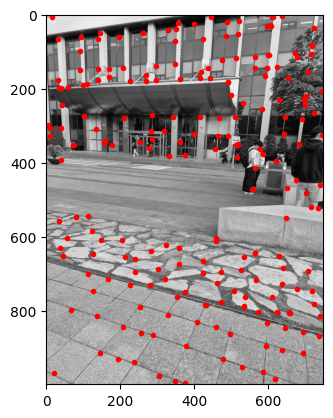

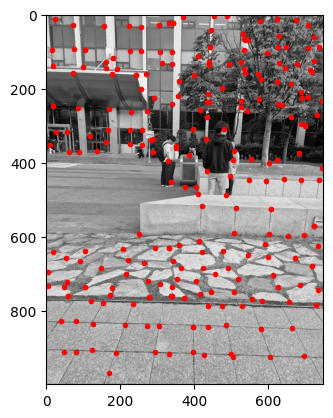

C:\Users\Inovicht\AppData\Local\Temp\ipykernel_20112\1641129198.py:8: RuntimeWarning: Mean of empty slice.
  product = np.mean((fd1 - fd1.mean()) * (fd2 - fd2.mean()))
f:\Github_Respositories\.venv\Lib\site-packages\numpy\_core\_methods.py:138: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)
f:\Github_Respositories\.venv\Lib\site-packages\numpy\_core\fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
f:\Github_Respositories\.venv\Lib\site-packages\numpy\_core\_methods.py:218: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
f:\Github_Respositories\.venv\Lib\site-packages\numpy\_core\_methods.py:175: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
f:\Github_Respositories\.venv\Lib\site-packages\numpy\_core\_methods.py:210: RuntimeWarning: invalid value encountered in divid

Plotting


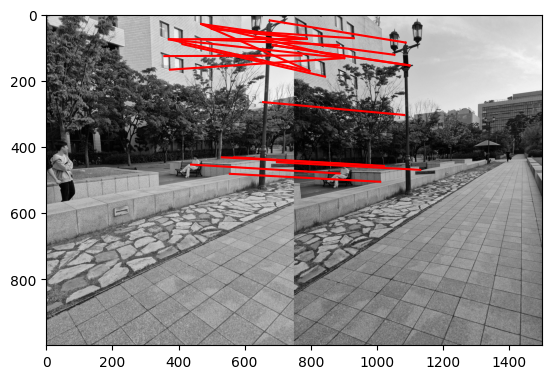

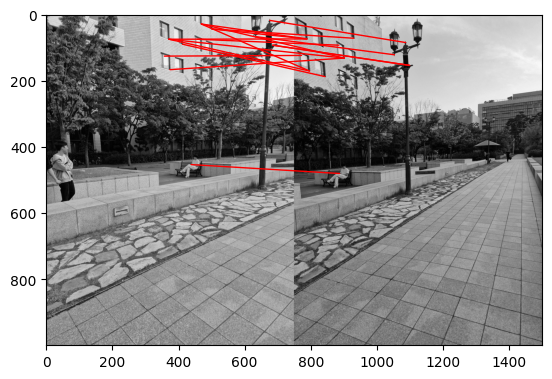

Number of inliers:  17
Average residual:  74.87509770964223
Plotting


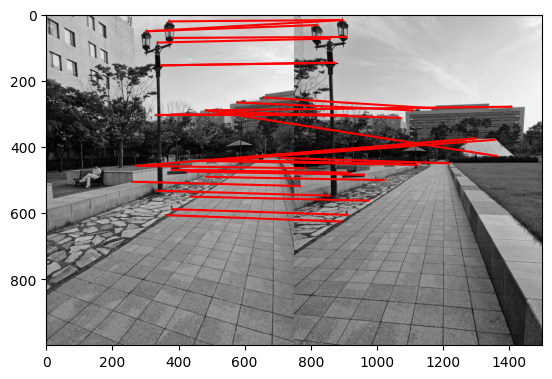

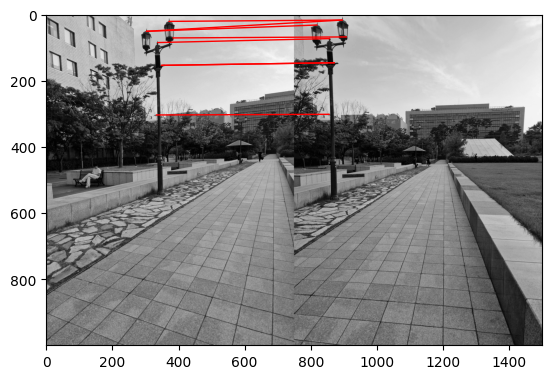

Number of inliers:  8
Average residual:  244.22121626730785
Plotting


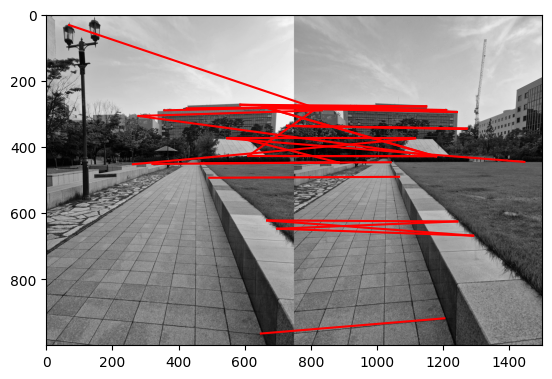

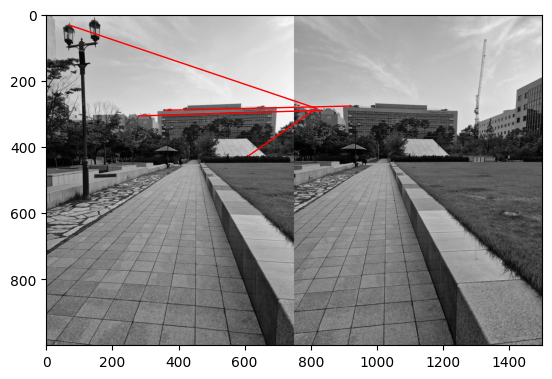

Number of inliers:  4
Average residual:  407.4549392054472
Plotting


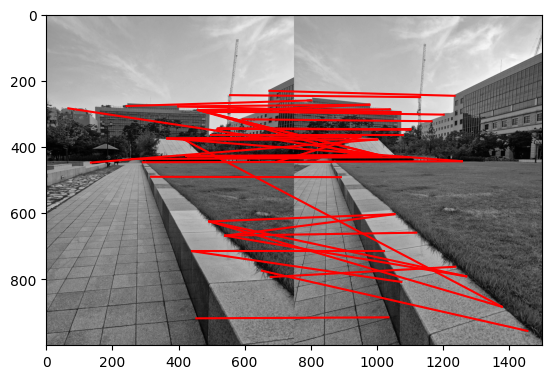

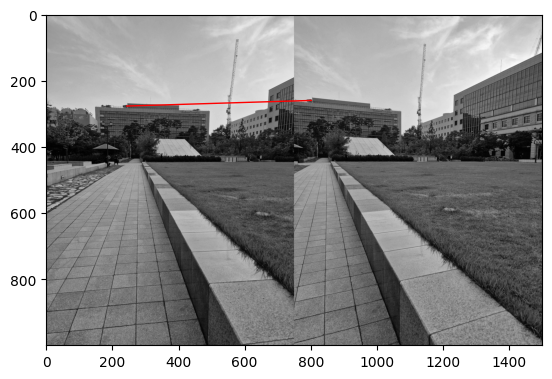

Number of inliers:  1
Average residual:  1817.4592243614047
Plotting


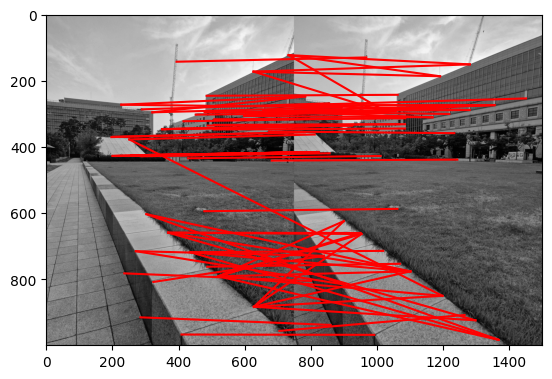

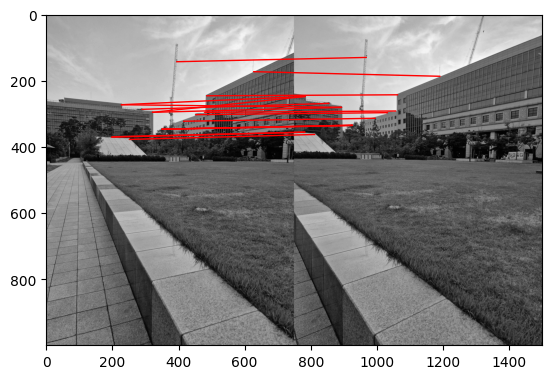

Number of inliers:  17
Average residual:  61.28735934155423
Plotting


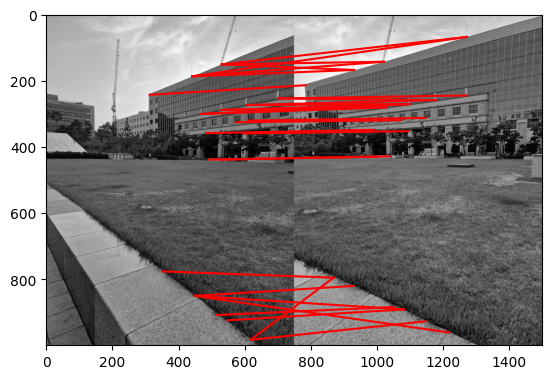

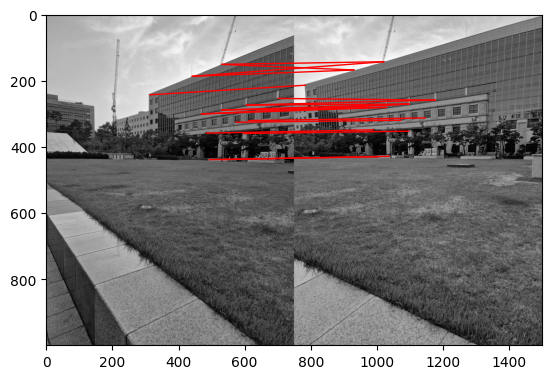

Number of inliers:  18
Average residual:  62.844188236098475
Plotting


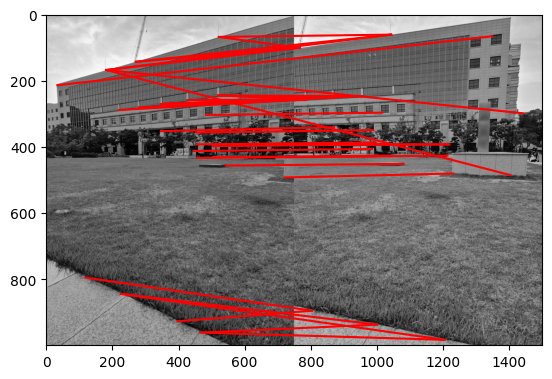

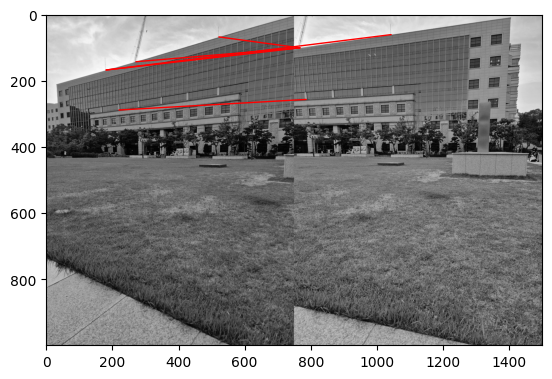

Number of inliers:  5
Average residual:  403.7513419407836
Plotting


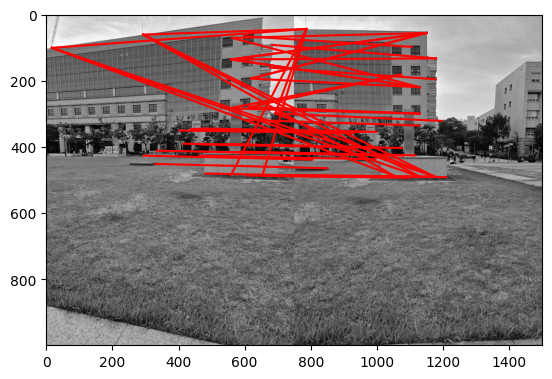

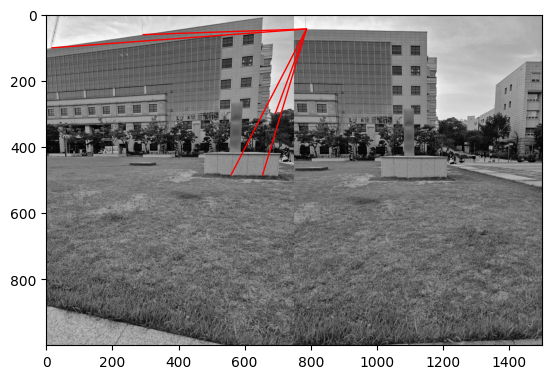

Number of inliers:  5
Average residual:  373.2196283694576
Plotting


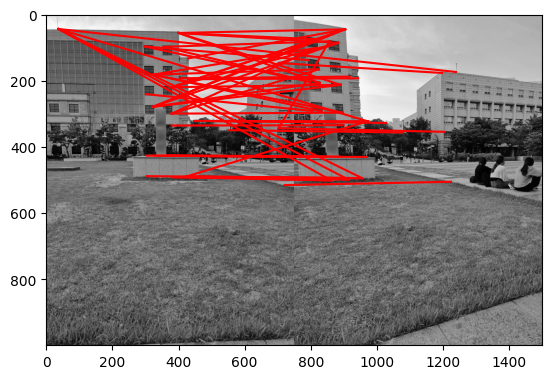

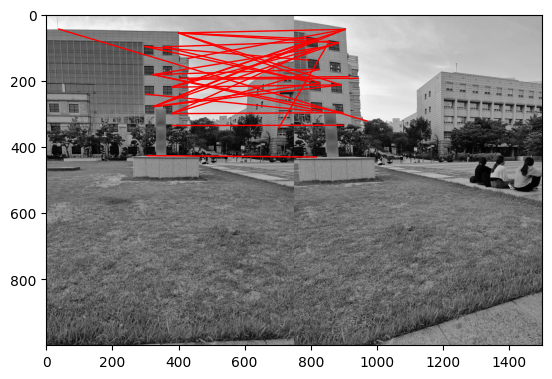

Number of inliers:  33
Average residual:  53.66755340412396
Plotting


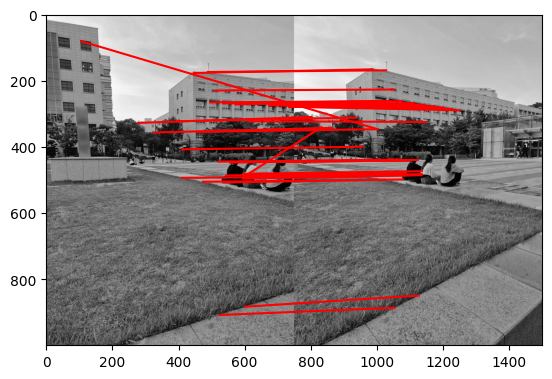

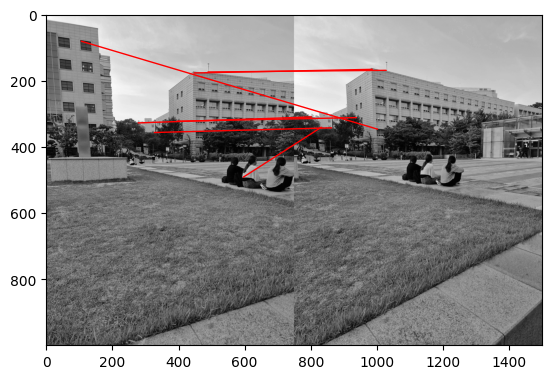

Number of inliers:  7
Average residual:  220.98790969500348
Plotting


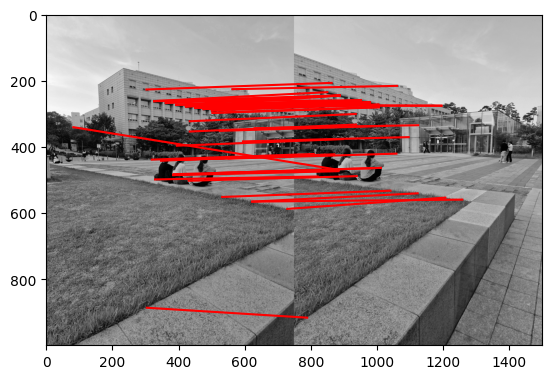

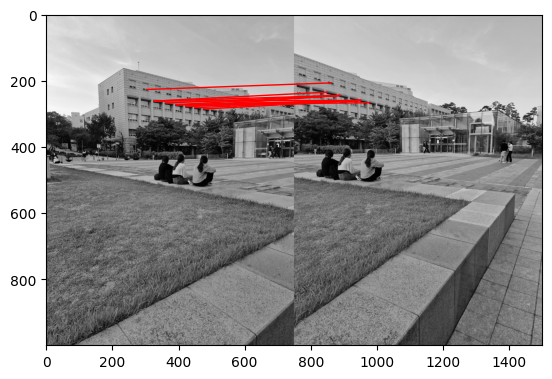

Number of inliers:  13
Average residual:  140.6653207907596
Plotting


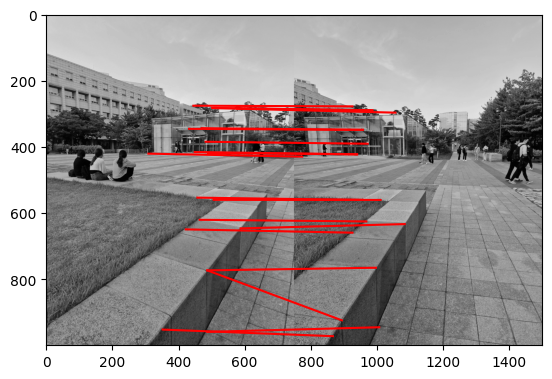

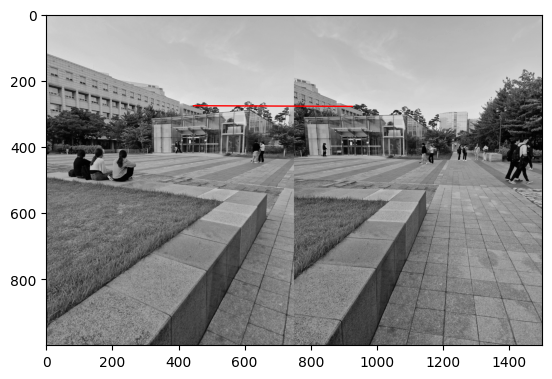

Number of inliers:  1
Average residual:  1703.4025725338145
Plotting


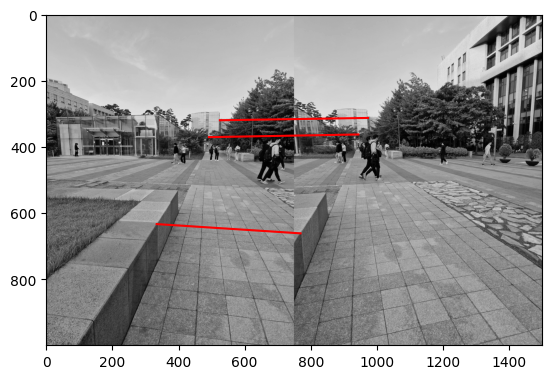

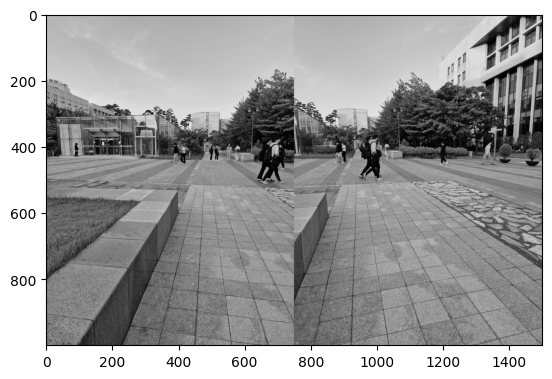

Exception: No matches between images

In [27]:
# Full pipeline
if __name__ == '__main__':
    Images = loadImages(Rotate=3)
    points = []
    feature_vector = []
    matches = []
    H = []
    for i in range(0,len(Images)):
        points.append(cornerDetect(Images[i],7,1))
        feature_vector.append(getFeatureDescriptors(Images[i],points[i],25))

    for i in range(len(Images)-1):
        matches.append(match2Images(Images[i],Images[i+1],points[i],points[i+1],feature_vector[i],feature_vector[i+1],0.85,plotting=True,state=1))
        H.append(refineMatches(matches[i],Images[i],Images[i+1],1000,100))
    warped_img = wrapImages(Images,H)